In [1]:
#
#         # # # # #
#       #           #
#     #           #   #
#   #             #   # #
#   #               #   #
#   #                   #
#   # # # # # # # # # # #
#   #                   #
#     #               #
#       #           #
#         # # # # #
#
# Filename:     DEATHSTAR_Example.py
# Created by:   Gabrielle Ross
# Last updated: 2/20/2024
# Github:       https://github.com/GGgabbs/DEATHSTAR/tree/main
# 
# Please cite our paper if you use this code!
# ADS link: https://ui.adsabs.harvard.edu/abs/2023MNRAS.tmp.3722R/abstract
#
# DEATHSTAR:    A system for confirming planets and identifying
#               false positive signals in TESS data using 
#               ground-based time domain surveys
#
# Purpose:      Imports the DEATHSTAR program,
#               allows you to run your vetting with only 1 function,
#               and shows step-by-step example with live target.

In [2]:
# Modules
from DEATHSTAR import setup # Importing DEATHSTAR and all its functionality
#setup(346418409, new_fitter = 346418386, signal_tic_ID = 346418402, is_period_revision = True)

346418409
TOI period duration: 0.14153034117624375
Uncertainty on time of future transit: 0.4616807079194357
12 stars are usable out of 28
16 stars that could be bright enough did not have enough points 
9 comparison stars
Target star (TIC 346418409) is at index 11


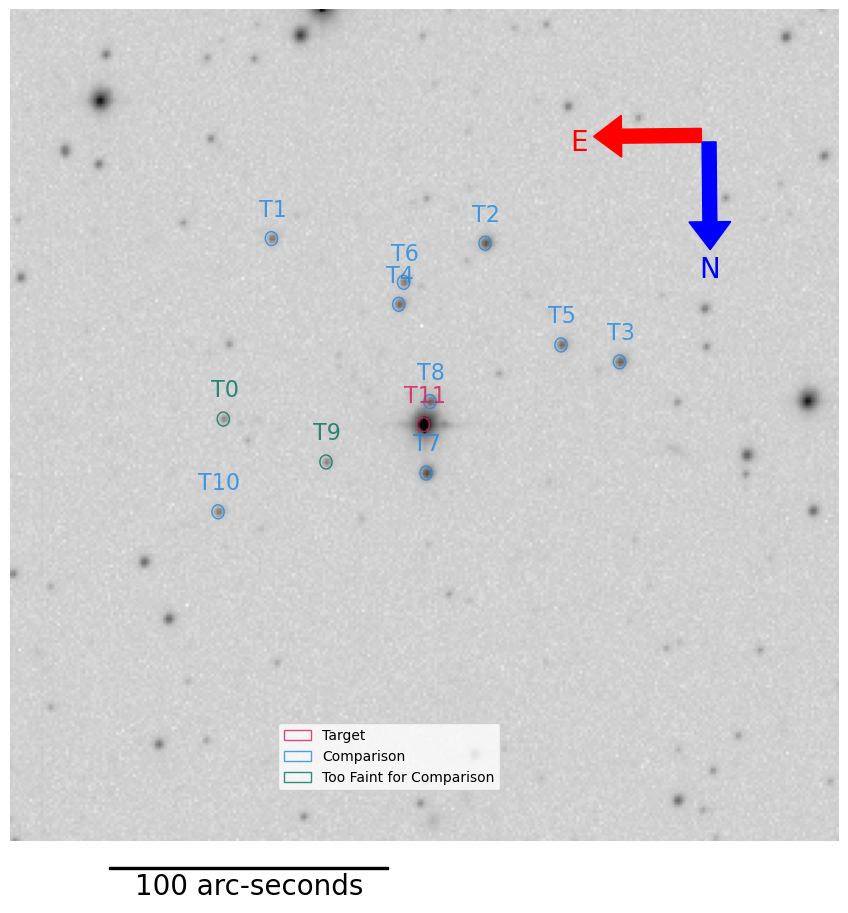

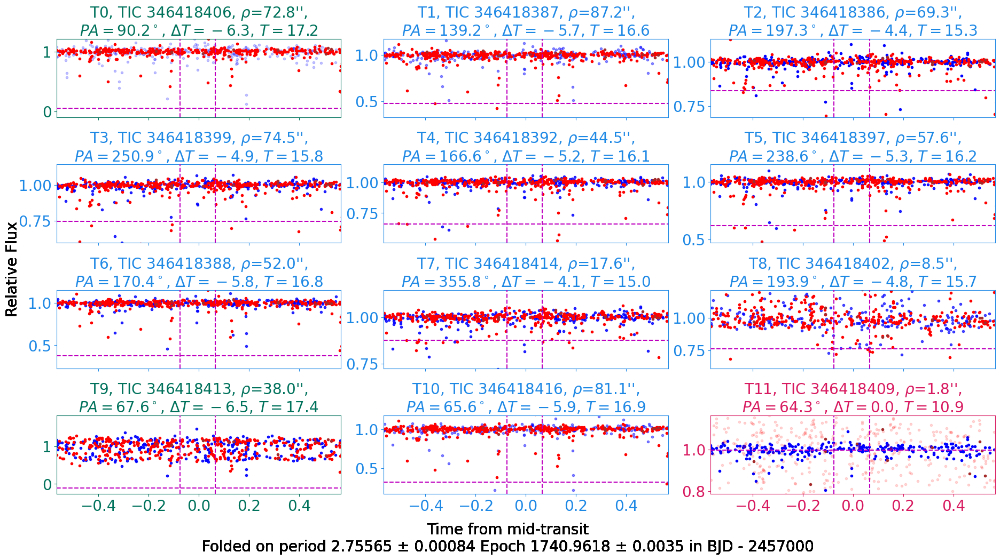

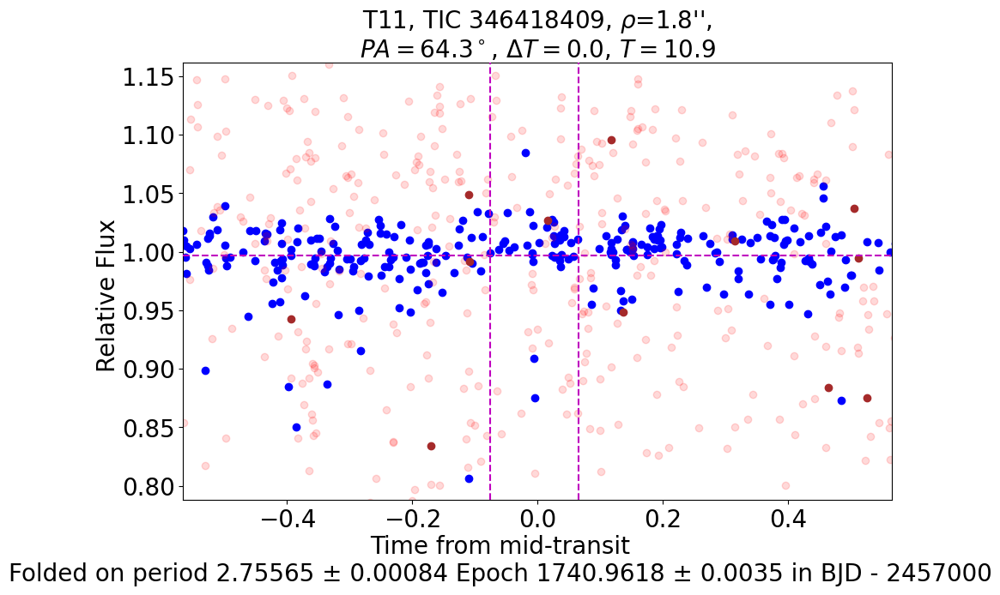

Creating report...
Done!


In [3]:
# Let's just run the target normally.
#
# I incorporated the new_fitter argument as for this target I realized the
# fitter chosen by hand with MAST was too close to the edge of the image bounds. 
# For a new target, you can just run: "setup(TIC_ID)"

setup(346418409, new_fitter = 346418386)

346418409
TOI period duration: 0.14153034117624375
Uncertainty on time of future transit: 0.4616807079194357
12 stars are usable out of 28
16 stars that could be bright enough did not have enough points 
8 comparison stars
Target star (TIC 346418409) is at index 11


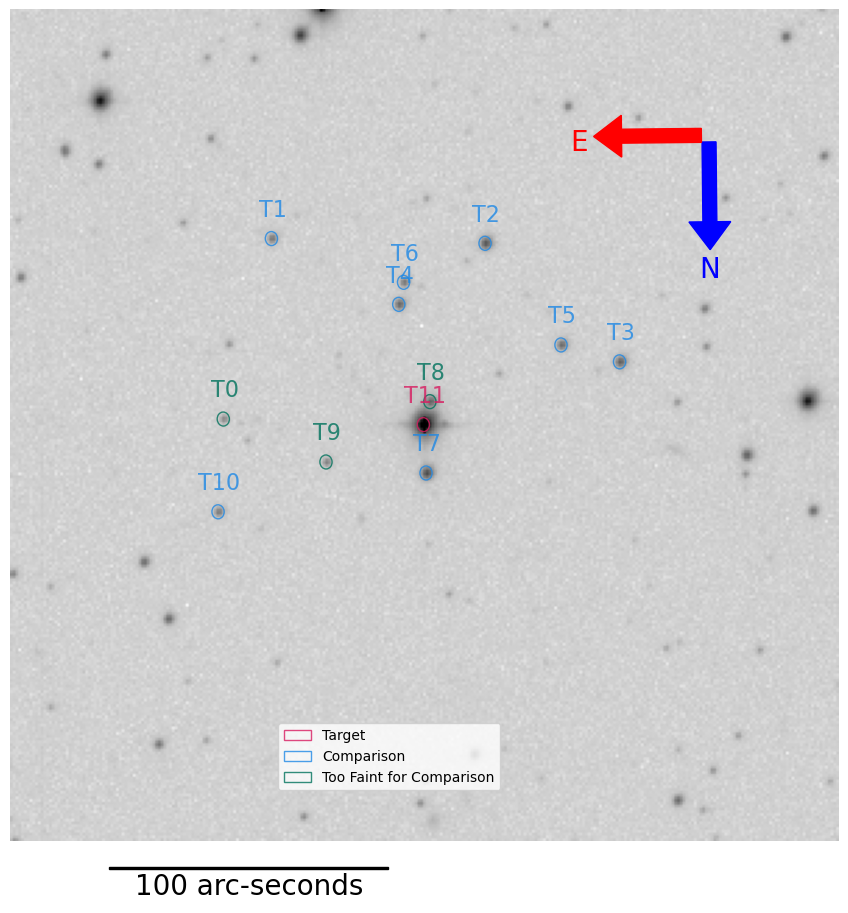

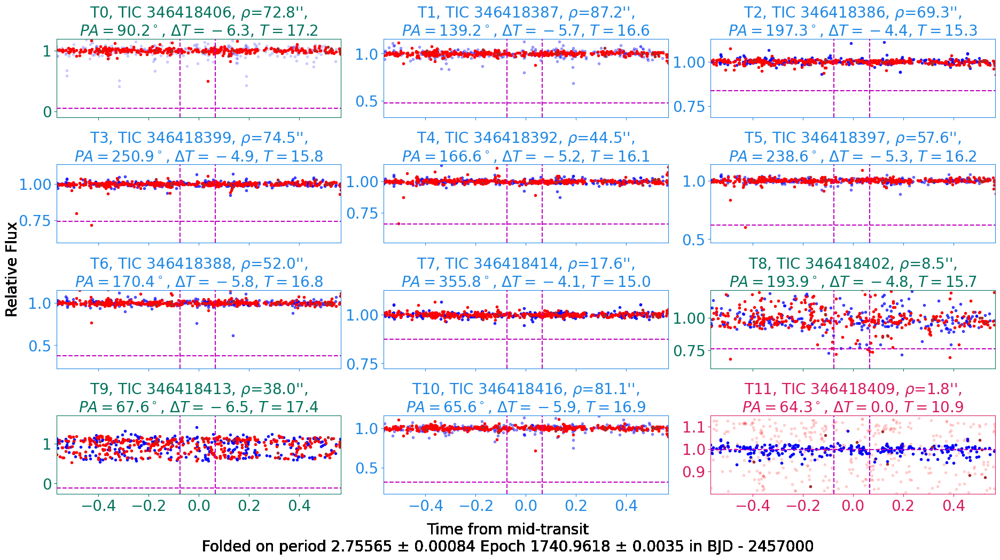

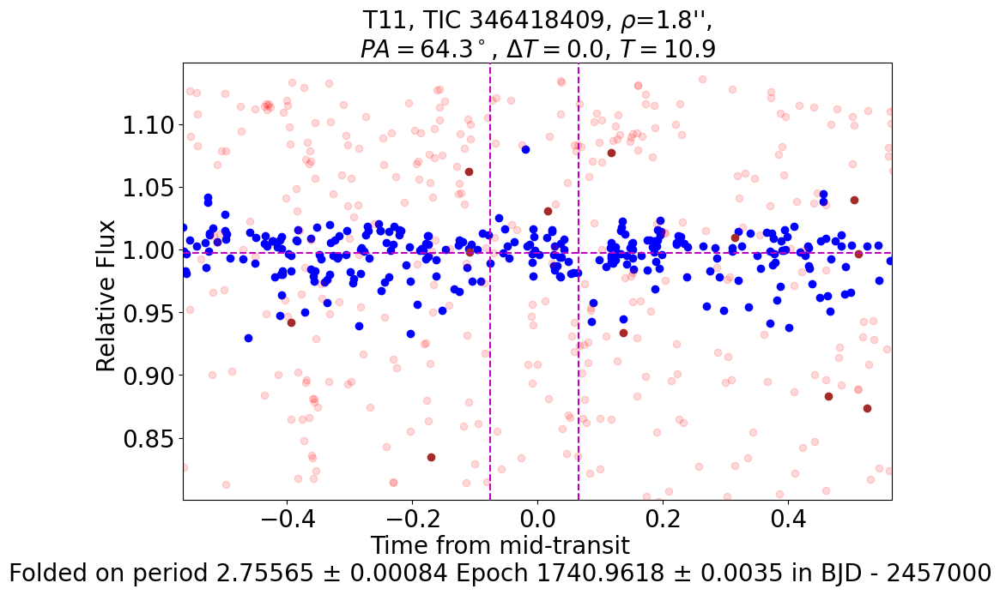

Creating report...
Done!


In [4]:
# Now dont see a clear signal here -- YET.
# There are a couple things we can do to troubleshoot!
# DEATHSTAR was created for being fast to replot light curves so that
# minor tweaks can be made to produce the cleanest signals!
#
# We can see on T3 that it is a fairly messy light curve but still counted
# as a comparison star. This means we should remove it.
# You can add additional comparison stars to remove manually (most are
# removed automatically) by adding the argument comparison_removal = 
# [TIC ID List]

setup(346418409, new_fitter = 346418386, comparison_removal = [346418402])

346418409
TOI period duration: 0.14153034117624375
Uncertainty on time of future transit: 0.4616807079194357
12 stars are usable out of 28
16 stars that could be bright enough did not have enough points 
8 comparison stars
Target star (TIC 346418409) is at index 11


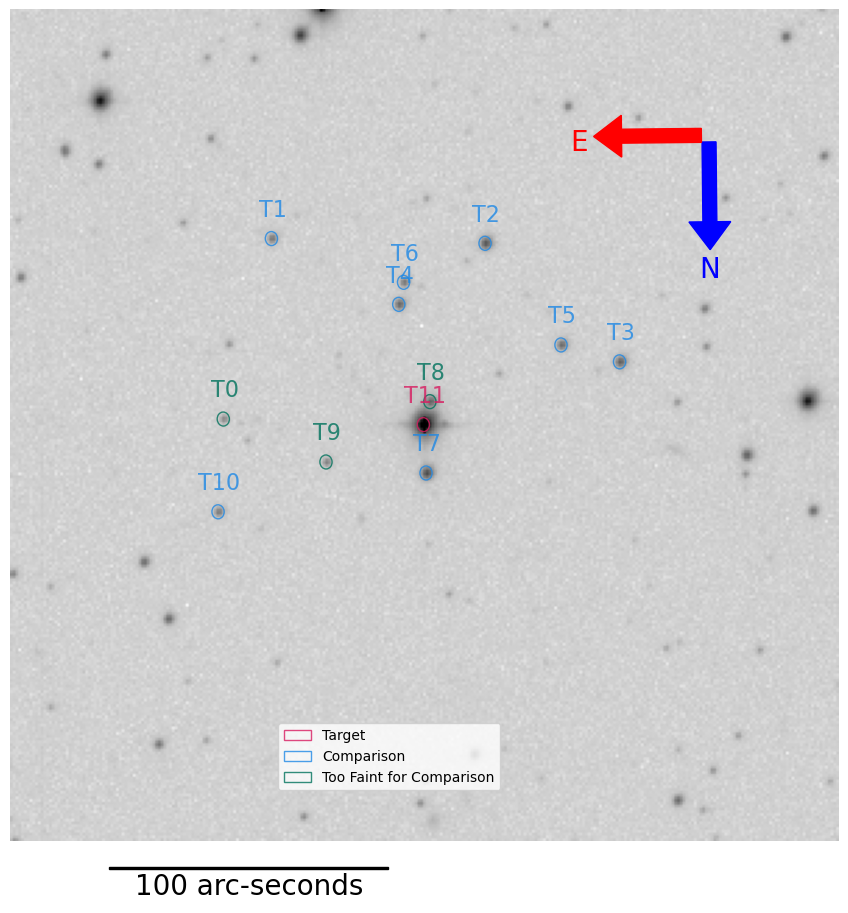

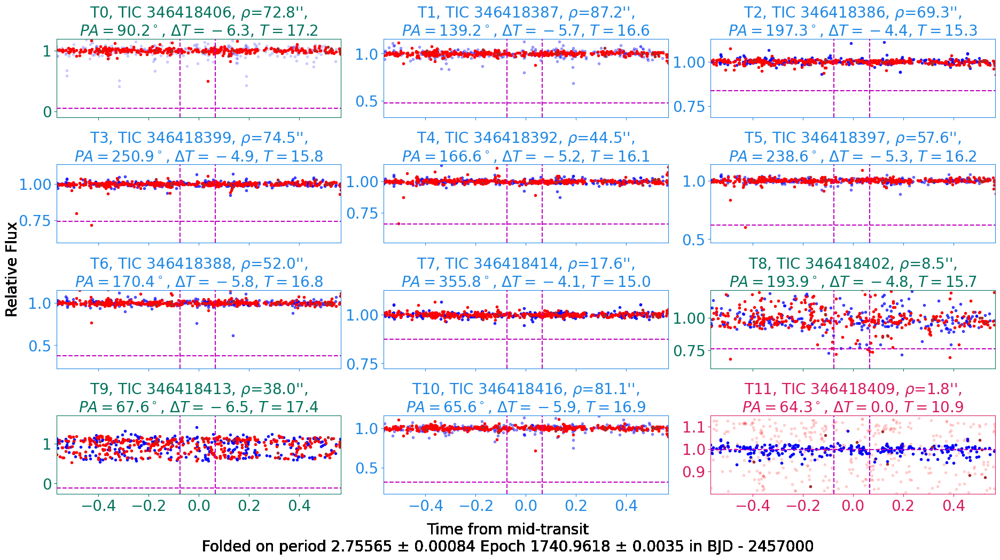

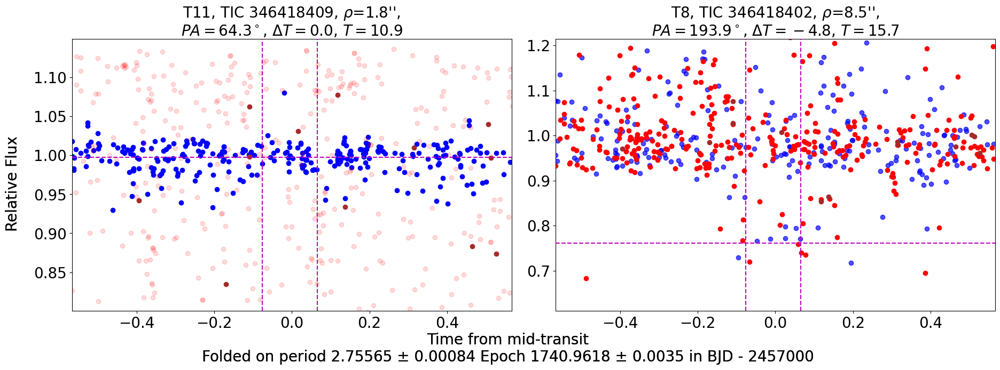

Creating report...
Done!


In [5]:
# These light curves are so much cleaner!
#
# We're still not yet seeing a signal, but T3 looks very sus.
# We can set potential signal sources using the 
# signal_tic_ID = TIC ID argument to plot them separately for
# easier viewing in a side-by-side plot.
# If the target is a supposed on-target detection, we do not need
# to set the signal_tic_ID argument.

setup(346418409, new_fitter = 346418386, comparison_removal = [346418402], signal_tic_ID = 346418402)

346418409
TOI period duration: 0.14153034117624375
Uncertainty on time of future transit: 0.4616807079194357
12 stars are usable out of 28
16 stars that could be bright enough did not have enough points 
8 comparison stars
Target star (TIC 346418409) is at index 11


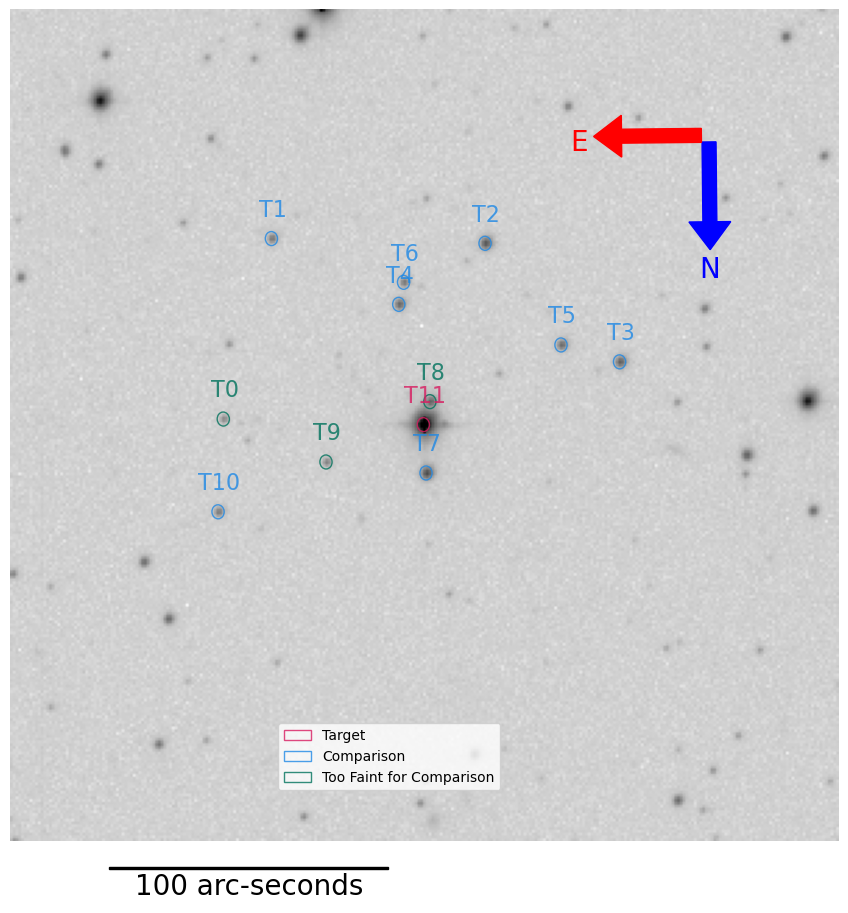

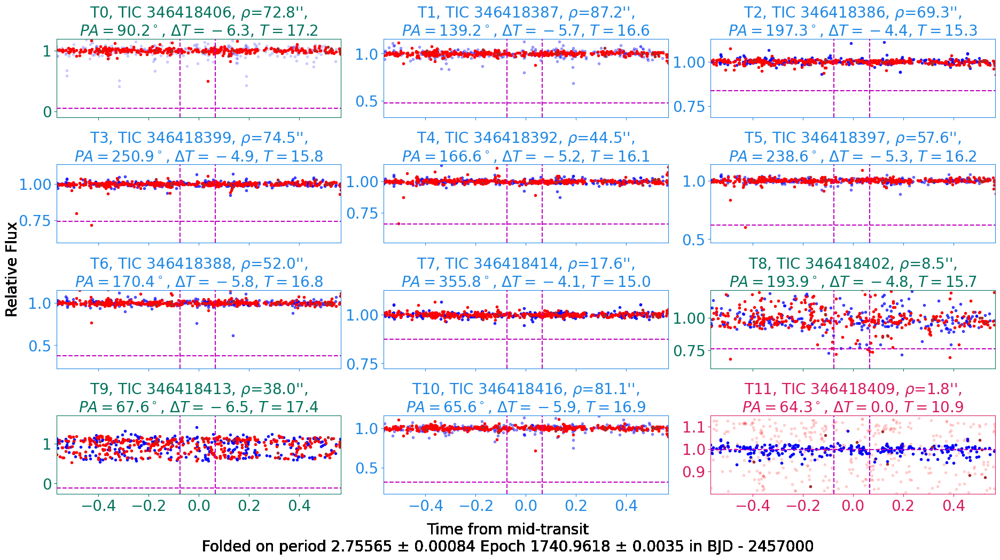

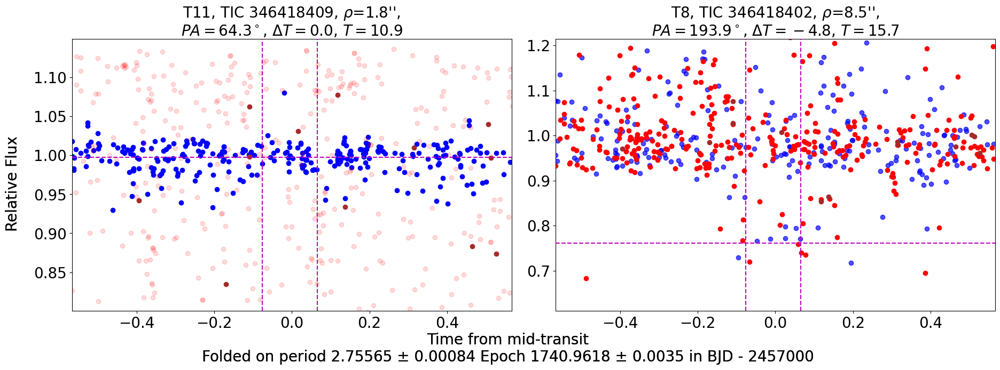

Creating report...
Done!


In [6]:
# As you can see, we added a new plot which is the target vs. signal
# comparison plot!
#
# As all signal light curves are naturally noiser (as they have a transit
# dip), any TIC set as the signal_tic_ID is automatically removed from
# the comparison stars list. Therefore, having TIC 346418402 under both
# the signal_tic_ID and comparison_removal arguments is redundant.
# You can remove the comparison_removal argument in this case.

setup(346418409, new_fitter = 346418386, signal_tic_ID = 346418402)

346418409
TOI period duration: 0.14153034117624375
Uncertainty on time of future transit: 0.0559051066102331
12 stars are usable out of 28
16 stars that could be bright enough did not have enough points 
8 comparison stars
Target star (TIC 346418409) is at index 11


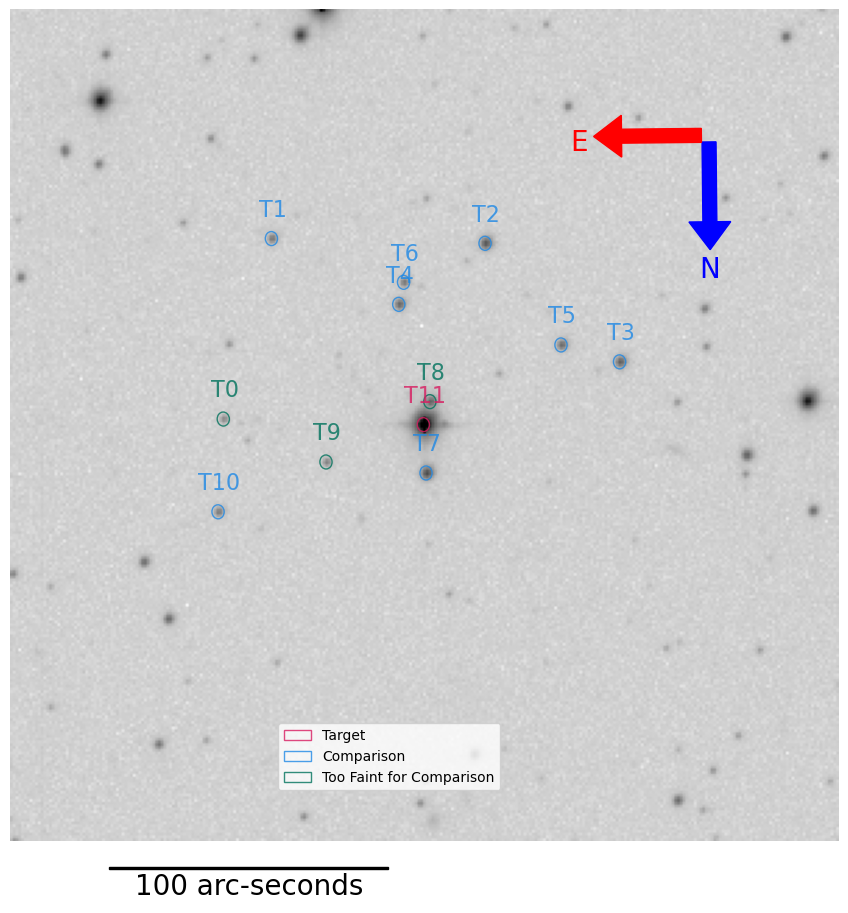

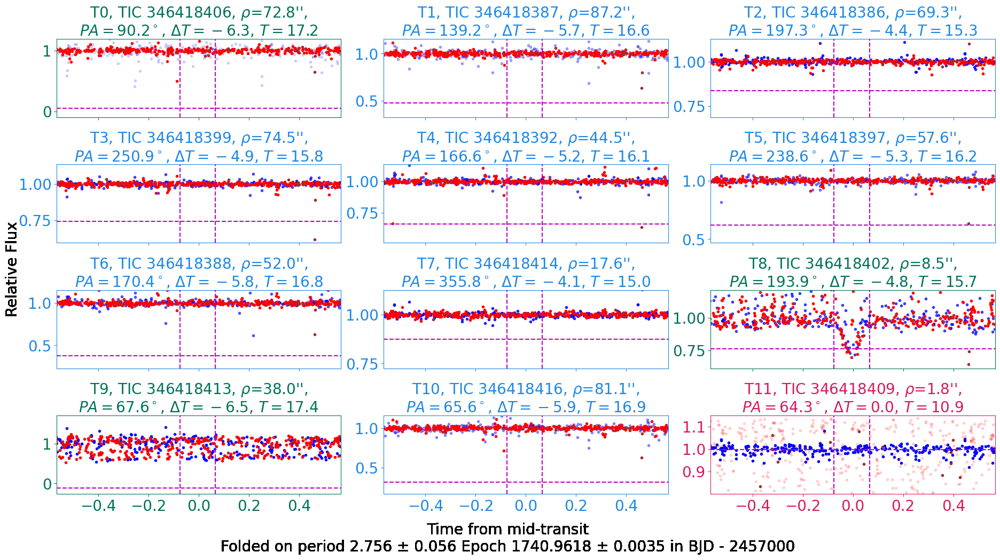

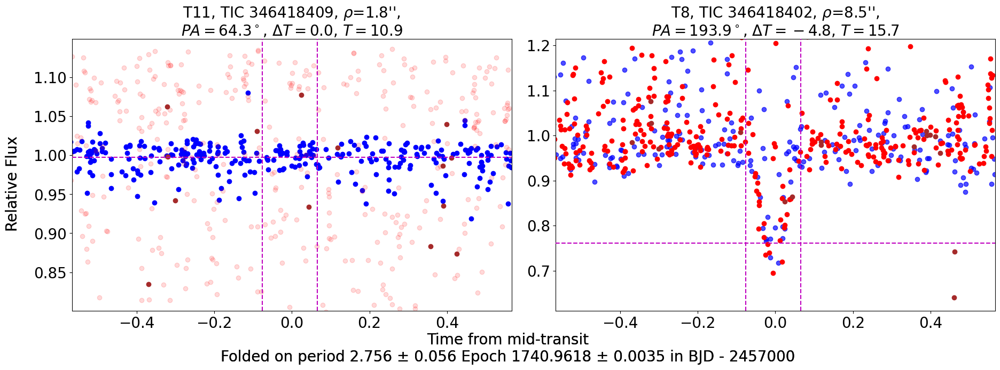

Creating report...
Done!


In [7]:
# There was no difference in the plots, but that change just simplifies
# our argument list.
#
# Here's why T3 looks 'sus':
# there are a decent number of points around the transit duration
# which can imply that the light curve was folded on the wrong period.
#
# We can see the TOI period duration is printed at roughly 0.14
# days while the propagated uncertainty on time at a future transit
# is roughly 0.46 days.
# As the uncertainty of the period is far larger than the duration,
# we should revise the period. If we have a revised period already
# found, we can add the argument revised_period = PERIOD in days.

setup(346418409, new_fitter = 346418386, signal_tic_ID = 346418402, revised_period = 2.756389)

346418409
TOI period duration: 0.14153034117624375
Uncertainty on time of future transit: 0.4616807079194357
12 stars are usable out of 28
16 stars that could be bright enough did not have enough points 
8 comparison stars
Target star (TIC 346418409) is at index 11


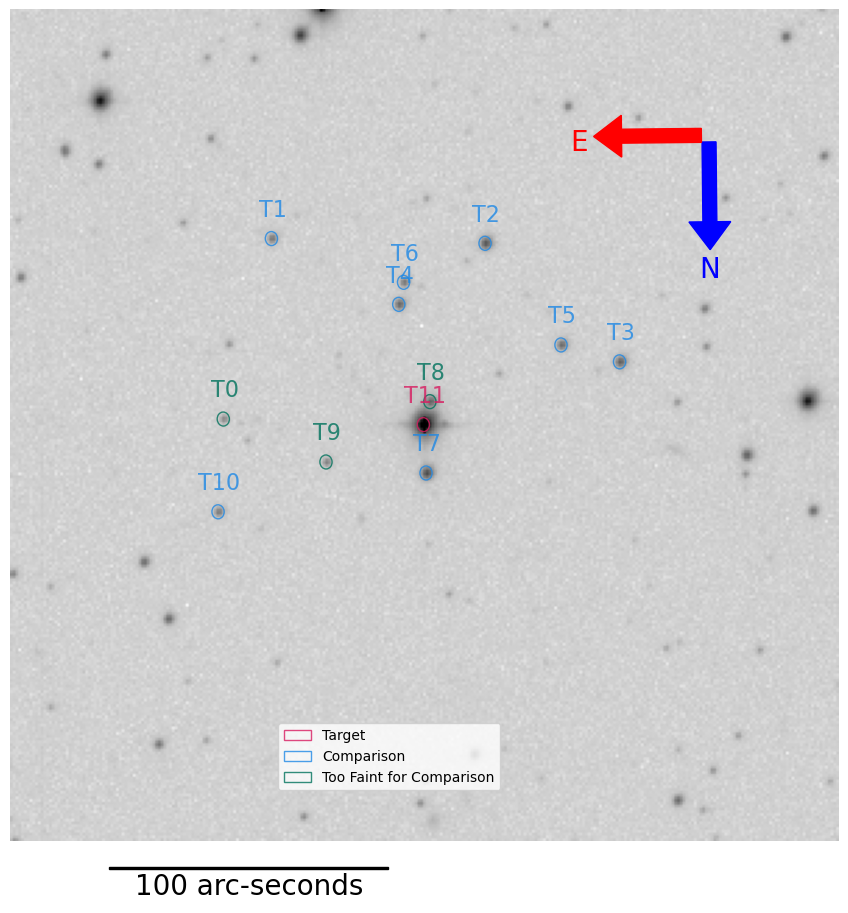

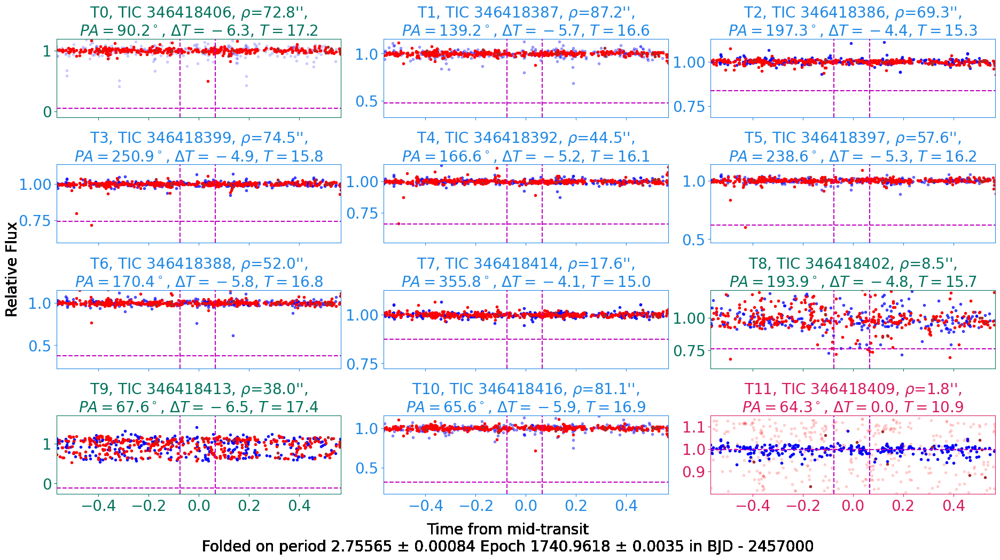

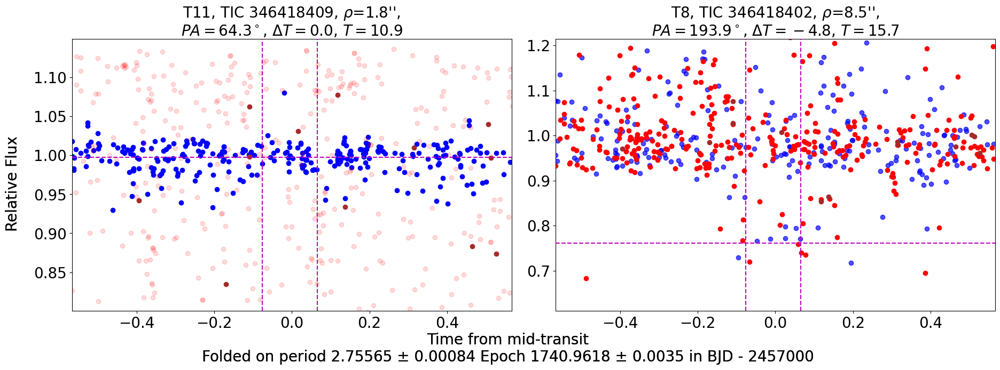

Revising period...
Revised period: 2.7564355758202796 days


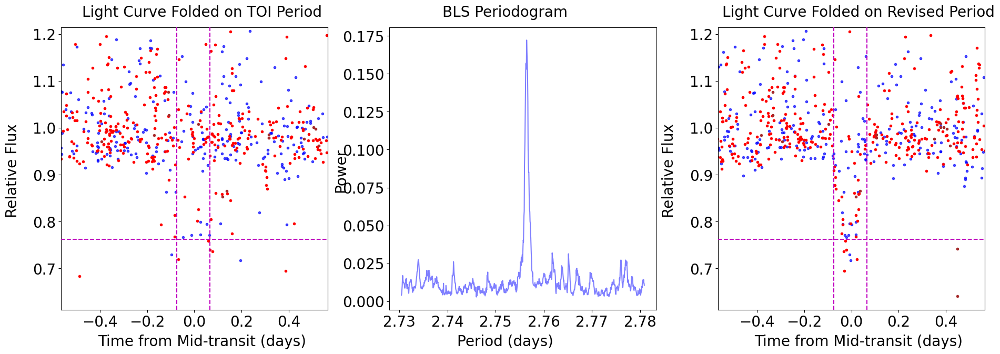

Creating report...
Done!
Revising period...
Revised period: 2.7564355758202796 days


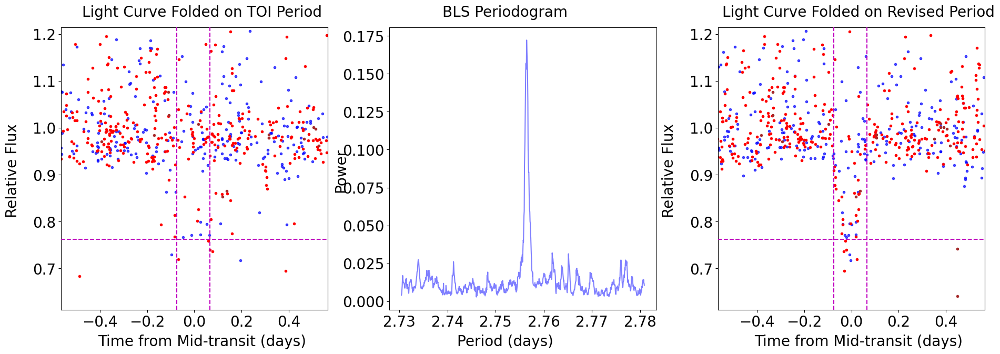

In [3]:
# Now we see a nice light curve and a great false positive confirmation!
# We have successfully killed this planet!!
#
# Not only do we see a clear light curve but also the uncertainty on the
# time of the future transit is far smaller than the transit duration
# -- we can ensure that our new period is good.
#
# If you do not have a revised period, you can preform a period
# revision by replacing the revised_period argument with
# is_period_revision = True
# The period revision will be preformed exclusively on the signal_tic_ID
# argument (if none is provided BLS will run on the target's light curve)

setup(346418409, new_fitter = 346418386, signal_tic_ID = 346418402, is_period_revision = True)

346418409
TOI period duration: 0.14153034117624375
Uncertainty on time of future transit: 0.4616807079194357
12 stars are usable out of 28
16 stars that could be bright enough did not have enough points 
8 comparison stars
Target star (TIC 346418409) is at index 11


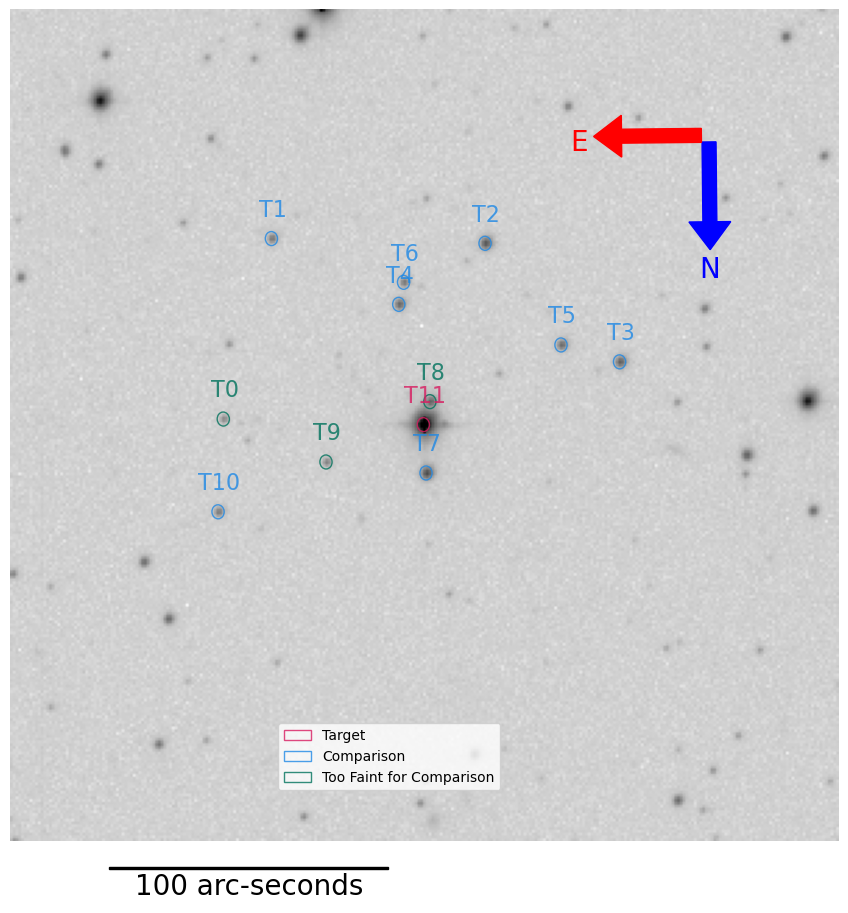

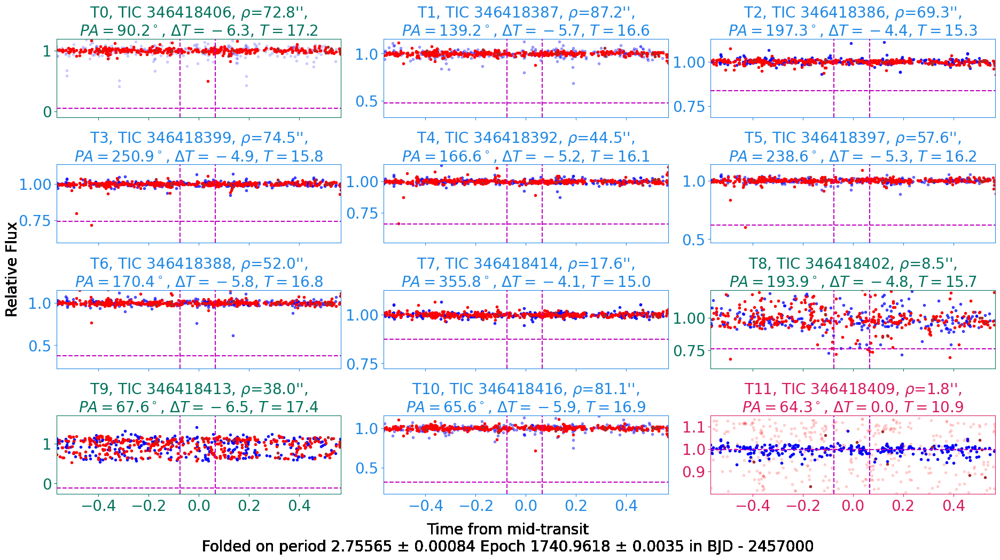

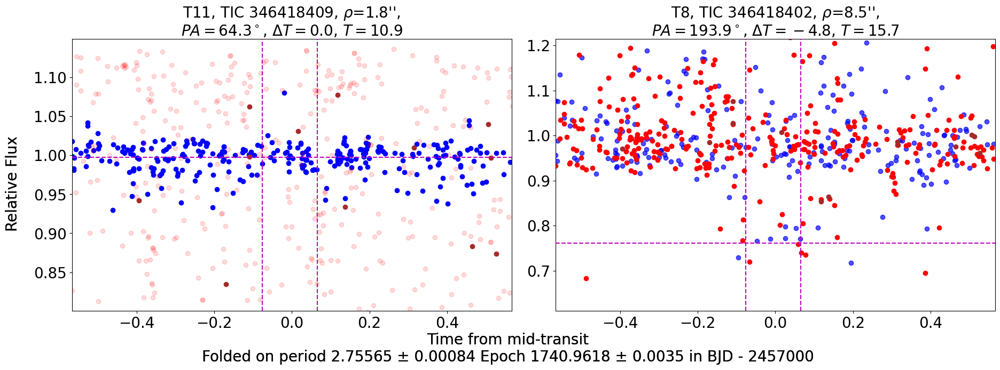

Revising period...
Revised period: 2.7564355758202796 days


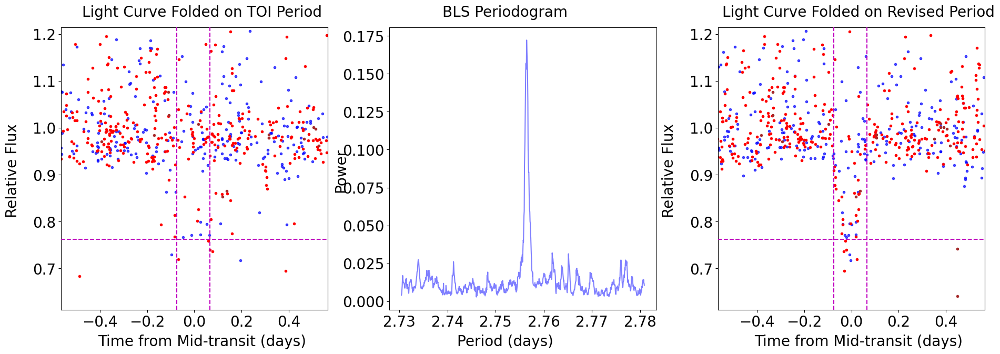

Binning lightcurves...


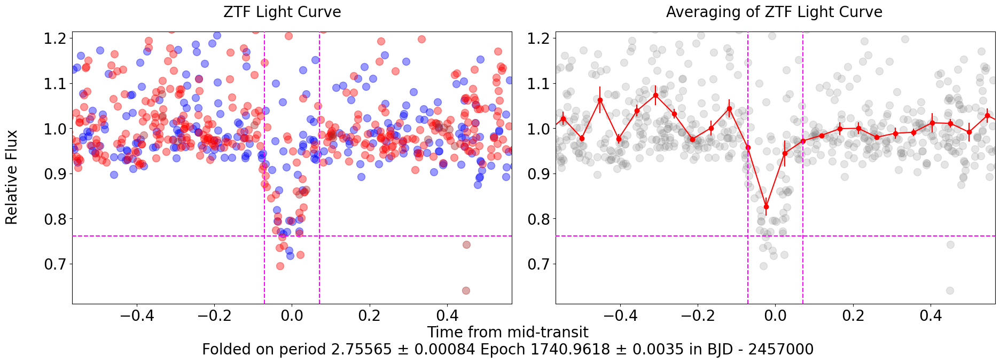

Creating report...
Done!
Revising period...
Revised period: 2.7564355758202796 days


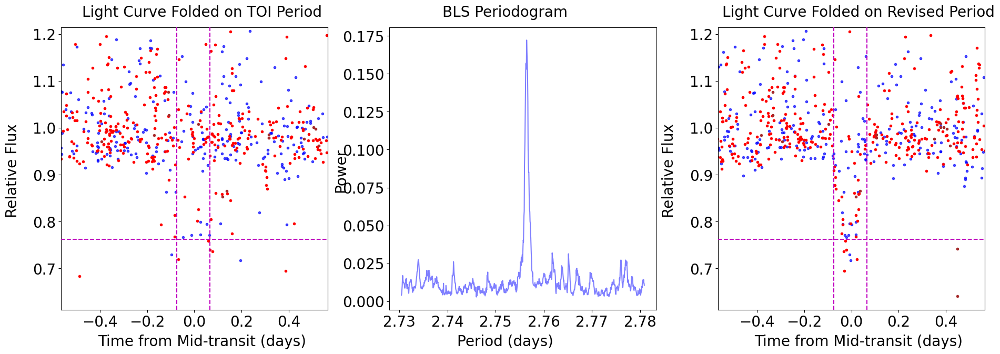

Binning lightcurves...


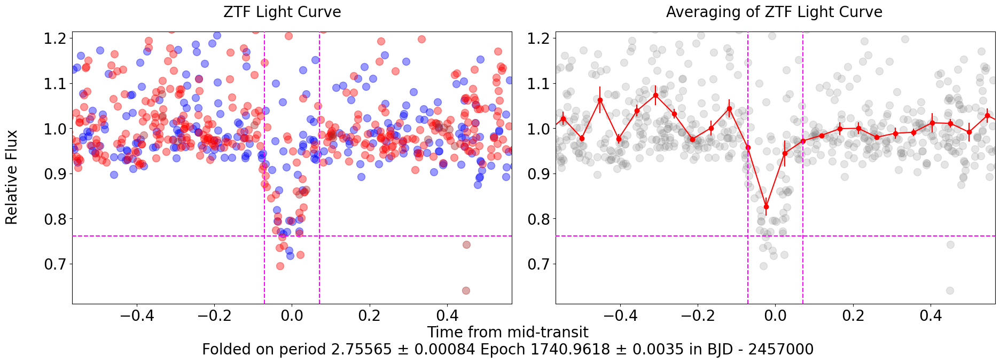

In [4]:
# This may not be the best period for this target (2.756436 days is 
# different than 2.756389 days), but we can clearly see a detection
# at least. We can also confirm our period revision was good as
# the BLS plot has a very clear spike at the optimal period.
#
# We also now see a 3-panel plot of the signal without period revision,
# the BLS preforming period revision, and the signal with the revised
# period found from the BLS.
#
# If the light curve has a much shallower transit or there are too
# many data points or the light curves are noiser, we can add an
# averaged plot by adding is_lcbin = True.
# The binning will be preformed exclusively on the signal_tic_ID argument
# (if none is provided lcbin will run on the target's light curve)

setup(346418409, new_fitter = 346418386, signal_tic_ID = 346418402, is_period_revision = True, is_lcbin = True)

In [5]:
# We now have access to a side-by-side plot of the signal with and without 
# binning for easier viewing.
#
# If you look in your folders under TICs and the target name (in this case
# TICs/346418409), you will see all of the saved versions of these plots.
# Each one of these plots is saved as .pdf, .png, and .eps for whatever
# cases you may need. There is also a Report.pdf file which is a singular
# .pdf document of all these plots in 1 to send more efficiently.
# You can view the MAD_vs_MAG plot to help remove noisy comparison stars.
#
# If you would like to perform your own period revision or plots, you can
# do so by accessing the Signal_Brightness.csv for a specific star. This
# file will be created for the target as well as the signal if signal_tic_ID
# is filled in. It is a normal .csv of the normalized and cleaned light curve

import pandas as pd # Open as pandas dataframe

tic_ID = 346418409 # Target
signal_tic_ID = 346418402 # False positive / signal

signal_brightnesses = pd.read_csv("TICs/" + str(tic_ID) + "/" + str(signal_tic_ID) + "_Signal_Brightnesses.csv") # Getting the light curve of the signal
print(signal_brightnesses.head) # Columns: flux (normalized at 1), time (BJD), filter (ZTF: g, r, i  ATLAS: o, c)

<bound method NDFrame.head of       Unnamed: 0      flux          time filter
0              0  0.770584  2.458744e+06      g
1              1  1.076833  2.458681e+06      g
2              2  0.949947  2.459083e+06      g
3              3  0.994966  2.458694e+06      g
4              4  0.900270  2.459082e+06      g
...          ...       ...           ...    ...
1514        1514  0.995848  2.459128e+06      i
1515        1515  0.999445  2.459112e+06      i
1516        1516  1.001414  2.459144e+06      i
1517        1517  1.011946  2.459145e+06      i
1518        1518  0.995468  2.459120e+06      i

[1519 rows x 4 columns]>
